In [915]:
import datetime
from tiingo import TiingoClient
import time
import pandas as pd
pd.set_option('mode.chained_assignment', None)
import numpy as np
from tqdm.notebook import tqdm
import plotly
import plotly.graph_objects as go
import matplotlib
import matplotlib.pyplot as plt
import pickle
%matplotlib inline



# tiingo API token:
# e9908f8f87c136a4d656c75a7dba05ee7daa9c23

# Utilities 
- Handle dates and times
- Fetch historical stock price data
- Classify price changes for ML
- Prepare data for ML

In [916]:
sim_data.index

DatetimeIndex(['2019-10-02 15:30:00+00:00', '2019-10-02 15:35:00+00:00',
               '2019-10-02 15:40:00+00:00', '2019-10-02 15:45:00+00:00',
               '2019-10-02 15:50:00+00:00', '2019-10-02 15:55:00+00:00',
               '2019-10-02 16:00:00+00:00', '2019-10-02 16:05:00+00:00',
               '2019-10-02 16:10:00+00:00', '2019-10-02 16:15:00+00:00',
               ...
               '2020-09-30 18:45:00+00:00', '2020-09-30 18:50:00+00:00',
               '2020-09-30 18:55:00+00:00', '2020-09-30 19:00:00+00:00',
               '2020-09-30 19:05:00+00:00', '2020-09-30 19:10:00+00:00',
               '2020-09-30 19:15:00+00:00', '2020-09-30 19:20:00+00:00',
               '2020-09-30 19:25:00+00:00', '2020-09-30 19:30:00+00:00'],
              dtype='datetime64[ns, UTC]', name='date', length=20588, freq=None)

In [917]:
string_to_datetime(start_date) + datetime.timedelta(days=3)

datetime.datetime(2020, 8, 6, 0, 0)

In [918]:
## Utilities ##
def string_to_datetime(date_string):
    format = "%Y-%m-%d"  # The format
    date_time = datetime.datetime.strptime(date_string, format)
    return date_time


assert string_to_datetime("2001-06-19") == datetime.datetime(2001, 6, 19, 0, 0)


def datetime_to_string(date_time):
    format = "%Y-%m-%d"
    date_string = date_time.strftime(format)
    return date_string


assert datetime_to_string(datetime.datetime(2001, 6, 19, 0, 0)) == "2001-06-19"


def circularize_time(a_datetime, output="sin"):
    minutes_in_a_day = 60 * 24
    minutes_into_day = a_datetime.minute + a_datetime.hour * 60
    if output == "sin":
        sin = np.sin((minutes_into_day - 1) * (2.0 * np.pi / minutes_into_day))
        return sin
    if output == "cos":
        cos = np.cos((minutes_into_day - 1) * (2.0 * np.pi / minutes_into_day))
        return cos


def circularize_date(a_datetime, output="sin"):
    days_in_a_year = 365
    days_into_year = (
        a_datetime.replace(year=2000, hour=0, minute=0, second=0, tzinfo=None)
        - datetime.datetime(year=2000, month=1, day=1)
    ).days
    if output == "sin":
        sin = np.sin((days_into_year - 1) * (2.0 * np.pi / days_in_a_year))
        return sin
    if output == "cos":
        cos = np.cos((days_into_year - 1) * (2.0 * np.pi / days_in_a_year))
        return cos


def get_extended_tick_data(
    symbol, start_date, end_date, market_data_db="./market_data_db.pickle"
):
    """API call with Tclient.get_dataframe() seems to be limited to 10000 rows,
    this function breaks up your call into multiple calls, and concats results
    """
    # if data freq changes, simple db storage logic breaks.
    frequency_min = 5

    # first check if the data is in the cached db
    try:
        with open(market_data_db, "rb") as handle:
            cached_db = pickle.load(handle)
    except FileNotFoundError:
        cached_db = {}

    if symbol in cached_db.keys():
        formatted_data = cached_db[symbol]
        # need to add some buffer for weekends, holidays etc
        buffer = datetime.timedelta(days=4)
        if (
            string_to_datetime(start_date).date()
            > (formatted_data.index.min() - buffer).date()
            and string_to_datetime(end_date).date()
            < (formatted_data.index.max() + buffer).date()
        ):
            return formatted_data[
                (formatted_data.index >= start_date)
                & (formatted_data.index <= end_date)
            ]

    # if data is not cached, download it
    trading_day_length_h = 6.5
    trading_day_length_m = trading_day_length_h * 60
    row_limit = 10000
    days_limit = row_limit / (trading_day_length_m / frequency_min)
    days_limit = round(
        days_limit * 1.30
    )  # add some buffer. market open 253/365 days of the year
    days_limit_timedelta = datetime.timedelta(days=days_limit)

    this_end_datetime = string_to_datetime(end_date)
    if (
        string_to_datetime(end_date) - string_to_datetime(start_date)
    ).days > days_limit:
        this_start_datetime = this_end_datetime - days_limit_timedelta
    else:
        this_start_datetime = string_to_datetime(start_date)
    pbar = tqdm(
        total=round(
            (
                (string_to_datetime(end_date) - string_to_datetime(start_date))
                / datetime.timedelta(days=1)
            )
            / days_limit
        )
    )

    all_history = pd.DataFrame()
    Tclient = TiingoClient({"api_key": "e9908f8f87c136a4d656c75a7dba05ee7daa9c23"})
    print("Fetching historical tick data")
    while (
        string_to_datetime(start_date) < this_start_datetime + days_limit_timedelta
    ):  # add bufffer so we get more data rather than less
        try:
            history = Tclient.get_dataframe(
                symbol,
                frequency=f"{frequency_min}min",
                startDate=datetime_to_string(this_start_datetime),
                endDate=datetime_to_string(this_end_datetime),
            )
            all_history = all_history.append(history)
        except KeyError:
            print(
                "could not get data for period: ",
                this_start_datetime,
                "to",
                this_end_datetime,
            )
        this_end_datetime = (
            this_end_datetime - days_limit_timedelta + datetime.timedelta(days=2)
        )  # add some overlap to be safe
        this_start_datetime = this_end_datetime - days_limit_timedelta
        pbar.update(1)

    pbar.close()
    formatted_data = all_history.loc[
        ~all_history.index.duplicated(keep="first")
    ].sort_index()

    # cache data in db
    if symbol in cached_db.keys():
        combined_data = cached_db[symbol].append(formatted_data)
        cached_db[symbol] = combined_data.loc[
            ~combined_data.index.duplicated(keep="first")
        ].sort_index()
    else:
        cached_db[symbol] = formatted_data
    with open(market_data_db, "wb") as handle:
        pickle.dump(cached_db, handle, protocol=pickle.HIGHEST_PROTOCOL)
    # sometimes start date is overshot a bit. can save to db, but dont want to return too much data
    return formatted_data[formatted_data.index >= start_date]


def classify_price_change(price_old, price_new):
    percent_change = (price_new - price_old) / price_old * 100
    if abs(percent_change) < 0.075:
        c = 0
    # average price change of entire stock market is around 0.75% / day
    if abs(percent_change) >= 0.075 and abs(percent_change) < 0.2:
        c = 1
    if abs(percent_change) >= 0.2 and abs(percent_change) < 0.5:
        c = 2
    if abs(percent_change) >= 0.5 and abs(percent_change) < 0.75:
        c=3
    if abs(percent_change) >= 0.75:
        c=4
    if percent_change < 0:
        return int(-c)
    else:
        return int(c)


def prepare_data_for_ML(
    raw_history,
    verbose=True,
    n_steps_back=24,
    prediction_minutes=-30,
):
    """ Pivots windows of time series data into rows for ML. """

    history = raw_history.drop(["high", "low", "open"], axis=1).rename(
        columns={"close": "price"}
    )
    if verbose == True:
        display(history)
        plt.scatter(
            history.index,
            history["price"],
        )
        plt.show()

    ## Pivot Data
    data_freq_mins = 5
    steps_back = np.linspace(
        data_freq_mins, data_freq_mins * n_steps_back, num=n_steps_back, dtype=int
    )
    new_columns = np.append(steps_back, prediction_minutes)
    for step in new_columns:
        mins_to_shift = step  # negative number for future, positive for past
        if mins_to_shift % data_freq_mins != 0:
            print("mins to shift MUST be a multiple of data_freq_mins")
            return
        else:
            shift_period = int(mins_to_shift / data_freq_mins)
            if shift_period < 0:
                history[f"price_in_{mins_to_shift}_min"] = history["price"].shift(
                    periods=shift_period
                )
            if shift_period > 0:
                history[f"price_{mins_to_shift}_min_ago"] = history["price"].shift(
                    periods=shift_period
                )

    history.dropna(inplace=True, axis=0, how="any")
    
    ## Classify prediction
    history["class"] = history.apply(
        lambda x: classify_price_change(
            x["price"], x[f"price_in_{prediction_minutes}_min"]
        ),
        axis=1,
    )

    ## Circularize Time and Date
    history["time_sin"] = (
        pd.Series(history.index).apply(circularize_time, output="sin").values
    )
    history["time_cos"] = (
        pd.Series(history.index).apply(circularize_time, output="cos").values
    )
    history["date_sin"] = (
        pd.Series(history.index).apply(circularize_date, output="sin").values
    )
    history["date_cos"] = (
        pd.Series(history.index).apply(circularize_date, output="cos").values
    )
    if verbose == True:
        display(history)
    return history

# Explore ML Models

In [919]:
# symbol = "AAPL"
# start_date = "2016-09-20"
# end_date = "2020-09-20"

# raw_history = get_extended_tick_data(
#     symbol, start_date=start_date, end_date=end_date, 
# )

### Checkout distribution of classes

In [920]:
# prediction_minutes = -60
# history = prepare_data_for_ML(raw_history, prediction_minutes=prediction_minutes)

# history['class'].hist()
# plt.show()
# history['class'].value_counts() / len(history)

### Split Into Train and Test

In [921]:
# from sklearn.model_selection import train_test_split


# X = history.drop([f'price_in_{prediction_minutes}_min', "class"], axis=1)
# y = history["class"]

# X_train, X_test, y_train, y_test = train_test_split(
#     X, y, test_size=0.33, random_state=42, stratify=y
# )

### Train a Classifier 

In [922]:
# from sklearn.pipeline import Pipeline
# from sklearn.pipeline import make_pipeline
# from sklearn.preprocessing import StandardScaler
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.neighbors import KNeighborsClassifier
# from sklearn.svm import SVC
# from sklearn.model_selection import cross_val_score

# classifier_pipeline = make_pipeline(StandardScaler(), RandomForestClassifier())

# scores = cross_val_score(classifier_pipeline, X_train, y_train, cv=3, n_jobs=-1)
# display(scores)

### Perform a grid search

In [923]:
# from sklearn.model_selection import GridSearchCV

# param_grid = {'randomforestclassifier__n_estimators': [10,50,100,200,300],
#               'randomforestclassifier__max_depth': [10, 20, 30, 50, 75, None]
#              }
# gridsearch = GridSearchCV(classifier_pipeline, param_grid, n_jobs=-1)
# gridsearch.fit(X_train, y_train)

### For:

GridSearchCV(estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('randomforestclassifier',
                                        RandomForestClassifier())]),
             n_jobs=-1,
             param_grid={'randomforestclassifier__max_depth': [10, 20, 30, 50,
                                                               75, None],
                         'randomforestclassifier__n_estimators': [10, 50, 100,
                                                                  200, 300]})
                                                                  
### Best Estimator:

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestclassifier',
                 RandomForestClassifier(max_depth=50, n_estimators=300))])
                 
                 
#### Best Score:
0.8046287658082232

In [924]:
# classifier_pipeline = make_pipeline(StandardScaler(), KNeighborsClassifier())

# scores = cross_val_score(classifier_pipeline, X_train, y_train, cv=3, n_jobs=-1)
# display(scores)

In [925]:
# classifier_pipeline = make_pipeline(StandardScaler(), SVC())

# scores = cross_val_score(classifier_pipeline, X_train, y_train, cv=3, n_jobs=-1)
# display(scores)

In [926]:
# classifier_pipeline.fit(X_train, y_train)

### Explore feature importance 

In [927]:
## Feature importance

# for name, score in zip(X_train.columns, classifier_pipeline.steps[1][1].feature_importances_):
#     print(name, score*100)

In [928]:
# from sklearn.model_selection import cross_val_predict
# from sklearn.metrics import confusion_matrix

# y_train_pred = cross_val_predict(classifier_pipeline, X_train, y_train, cv=3, n_jobs=-1)
# c_mat = confusion_matrix(y_train, y_train_pred)

### Look at some context specific performance metrics

In [929]:
### ### correct_sign = (np.sign(y_train) == np.sign(y_train_pred))
# within_2 = y_train_pred -  y_train <= 2
# within_1 = y_train_pred -  y_train <= 1

# print('percent of time correct sign was predicted: ',
#       len(correct_sign[correct_sign==True]) / len(correct_sign) * 100
#      )

# print('percent of time class was within 2: ',
#       len(within_2[within_2==True]) / len(within_2) * 100
#      )
# print('percent of time class was within 1: ',
#       len(within_1[within_1==True]) / len(within_1) * 100
#      )

### Visualize Confusion Matrix

In [930]:
# classes = set(y_train.values)
# n_classes = len(classes)

# display(c_mat)

# row_sums = c_mat.sum(axis=1, keepdims=True)
# norm_c_mat = c_mat / row_sums

# fig = plt.figure(figsize=(6,6))
# ax = plt.gca()
# ax.set_ylabel('Actual')
# ax.set_title('Predicted')
# ax.set_xticks(np.arange(n_classes))
# ax.set_xticklabels([x for x in range(min(classes),max(classes) + 1)])
# ax.set_yticks(np.arange(n_classes))
# ax.set_yticklabels([x for x in range(min(classes),max(classes) + 1)])


# im = ax.matshow(norm_c_mat, cmap=plt.cm.gray)
# plt.show()

# # view only errors
# norm_c_mat_er = norm_c_mat.copy()
# np.fill_diagonal(norm_c_mat_er, 0)

# fig = plt.figure(figsize=(6,6))
# ax = plt.gca()
# ax.set_ylabel('Actual')
# ax.set_title('Predicted')
# ax.set_xticks(np.arange(n_classes))
# ax.set_xticklabels([x for x in range(min(classes),max(classes) + 1)])
# ax.set_yticks(np.arange(n_classes))
# ax.set_yticklabels([x for x in range(min(classes),max(classes) + 1)])

# im = ax.matshow(norm_c_mat_er, cmap=plt.cm.gray)
# print('\n Errors Only:')
# plt.show()

Distribution of data is  slightly concerning. May need to rethink that... but the results look pretty damn good. When there are classification errors, they are (by and large) still in the correct direction. i.e. positive values are predicted as positive, negative as negative

Good time to think about 

# Simulate model implementation
Lets start fresh and train a model, then simulate returns after implementing this model  

In [931]:
def train_model(
    symbol,
    start_date,
    end_date,
    verbose=True,
    cross_val=False,
    prediction_minutes=-60,
    n_steps_back=24,
    training_data_extent=750,
):
    # Fetch and prepare training data
    training_start_date = datetime_to_string(
        (string_to_datetime(start_date) - datetime.timedelta(days=training_data_extent))
    )
    training_end_date = datetime_to_string(
        (string_to_datetime(start_date) - datetime.timedelta(days=1))
    )
    raw_training_data = get_extended_tick_data(
        symbol,
        start_date=training_start_date,
        end_date=training_end_date,
    )
    training_data = prepare_data_for_ML(
        raw_training_data,
        verbose=verbose,
        n_steps_back=n_steps_back,
        prediction_minutes=prediction_minutes,
        
        
    )
    X_train = training_data.drop(
        [f"price_in_{prediction_minutes}_min", "class"], axis=1
    )
    y_train = training_data["class"]

    # Shuffle training data
    X_train = X_train.sample(frac=1, random_state=42)
    y_train = y_train.sample(frac=1, random_state=42)

    # Fetch and prepare test data
    raw_test_data = get_extended_tick_data(
        symbol,
        start_date=start_date,
        end_date=end_date,
    )
    test_data = prepare_data_for_ML(
        raw_test_data,
        verbose=verbose,
        n_steps_back=n_steps_back,
        prediction_minutes=prediction_minutes,
    )
    X_test = test_data.drop([f"price_in_{prediction_minutes}_min", "class"], axis=1)
    y_test = test_data["class"]

    if verbose == True:
        # visuals
        print("class distribution in training data")
        y_train.hist()
        plt.show()
        y_train.value_counts() / len(y_train)
        print("class distribution in test data")
        y_test.hist()
        plt.show()
        y_test.value_counts() / len(y_test)

    # Train a model
    clf = make_pipeline(
        StandardScaler(), RandomForestClassifier(max_depth=50, random_state=42)
    )
    print("Training a Classifier")
    clf.fit(X_train, y_train)
    if cross_val:
        print("Determining Classifier Cross Val Scores...")
        scores = cross_val_score(clf, X_train, y_train, cv=3, n_jobs=-1)
        display(scores)

    # print some stats
    y_test_predicted = clf.predict(X_test)
    if verbose == True:
        ## General stats on test data
        perfect = y_test_predicted == y_test
        within_1 = y_test_predicted - y_test <= 1
        within_2 = y_test_predicted - y_test <= 2

        print(
            "percent of time class was predicted successfully",
            len(perfect[perfect == True]) / len(perfect) * 100,
        )
        print(
            "percent of time class was within 1: ",
            len(within_1[within_1 == True]) / len(within_1) * 100,
        )
        print(
            "percent of time class was within 2: ",
            len(within_2[within_2 == True]) / len(within_2) * 100,
        )
    return clf, training_data, test_data

In [943]:
def get_proability_coefficient(prob_list):
    n_classes = len(prob_list)
    first_positive_class_index = int(np.ceil(n_classes/2))
    positive_prob = sum(prob_list[first_positive_class_index:])
    return np.interp(positive_prob,[0.50,1],[0,3])
        
    
    
## get inital data and classifier
def implementation_simulation(
    verbose=True,
    daily_retrain=False,
    symbol="VTI",
    start_date="2020-8-03",
    end_date="2020-10-01",
    training_data_extent=365,
    prediction_minutes=-30,
    n_steps_back=24,
    base_investment=100,
    # starting balance should be absolute min of 6x (precition distance/interval) base investment
    starting_balance=1000,
):

    clf, training_data, test_data = train_model(
        symbol,
        start_date,
        end_date,
        verbose=verbose,
        prediction_minutes=prediction_minutes,
        n_steps_back=n_steps_back,
        training_data_extent=training_data_extent,
    )

    # prepare data for investment simulation
    sim_data = test_data[
        [
            "price",
            f"price_in_{prediction_minutes}_min",
            "class",
        ]
    ]
    sim_data["percent_change"] = (
        sim_data[f"price_in_{prediction_minutes}_min"] - sim_data["price"]
    ) / sim_data["price"]

    EOD = datetime.datetime(1, 1, 1, hour=20)
    model_predictions = []
    prob_coefs = []
    sell_orders = {}
    sold_record = {}
    balance_history = []
    balance = starting_balance

    # execute simulated investments
    for date in sorted(set(test_data.index.date)):
        # retrain classifier before days simulation
        if daily_retrain:
            clf, _training_data, _test_data = train_model(
                symbol,
                start_date=datetime_to_string(date),
                end_date=datetime_to_string(date + datetime.timedelta(days=1)),
                verbose=verbose,
                prediction_minutes=prediction_minutes,
                training_data_extent=training_data_extent,
            )

        day_data = test_data[
            (test_data.index >= datetime_to_string(date))
            & (test_data.index <= datetime_to_string(date + datetime.timedelta(days=1)))
        ]

        X = day_data.drop([f"price_in_{prediction_minutes}_min", "class"], axis=1)
        # Make Prediction
        predictions = clf.predict(X)
        day_data["prediction"] = predictions
        day_data["probability"] = clf.predict_proba(X).tolist()
        day_data["percent_change"] = (
            day_data[f"price_in_{prediction_minutes}_min"] - day_data["price"]
        ) / day_data["price"]
        model_predictions.extend(predictions)
        prob_coefs.extend([get_proability_coefficient(probs) for probs in clf.predict_proba(X).tolist()])
        
        # for each row (5 minute interval)
        for row in day_data.itertuples():
            # Dont consider buying if we are in last part of trading day
            # dont want to predict prices after market closes
            if (
                row.Index.time()
                < (EOD - datetime.timedelta(minutes=abs(prediction_minutes))).time()
            ):
                # Buy shares if model says so
                proability_coefficient = get_proability_coefficient(row.probability)
                if row.prediction > 0:
                    investment_amount = base_investment * row.prediction * proability_coefficient
                    if investment_amount > 0:
                        sell_price = (
                            investment_amount + investment_amount * row.percent_change
                        )
                        if balance >= investment_amount:
                            balance -= investment_amount
                            # place sell order for 1 hour in the future
                            sell_time = row.Index + datetime.timedelta(
                                minutes=-prediction_minutes
                            )
                            sell_orders[sell_time] = sell_price
                        else:
                            if verbose == True:
                                print("Insufficient Funds for investment")
            # Sell shares
            if row.Index in sell_orders.keys():
                sale_price = sell_orders[row.Index]
                balance += sale_price
                sold_record[row.Index] = sale_price
                sell_orders.pop(row.Index)

            # update balance
            balance_history.append(balance)
    sim_data["prediction"] = model_predictions
    sim_data["probability_coeficient"] = prob_coefs
    sim_data["balance"] = balance_history
    if len(sell_orders) > 0:
        if verbose == True:
            print("Simulation ended with unresolved sell orders")
            print("remaining sell orders:")
            print(sell_orders)
        leftover = sum(sell_orders.values())
        print(f"Adding value of remaining sell orders ${leftover} to balance")
        sim_data["balance"][-1] += leftover
    sold_record_df = pd.DataFrame.from_dict(sold_record, orient="index")
    return sim_data, sold_record_df


# consider adding this code in for sim gaurdrails
# # check that available data aligns with function inputs
# # need to add some buffer for weekends, holidays and closure
# buffer = datetime.timedelta(days=4)
# if string_to_datetime(start_date).date() < (ticker_history.index.min() - buffer).date():
#     print("ERROR: Start date preceeds ticker history")
#     return None
# if string_to_datetime(end_date).date() > (ticker_history.index.max() + buffer).date():
#     print("ERROR: End date exceeds ticker history")
#     return None

In [944]:
# def implementation_simulation(
#     symbol,
#     model,
#     start_date,
#     end_date,
#     base_investment=100,
#     starting_balance=1200,  # should be absolute min of 12x (precition distance/interval) base investment
#     prediction_minutes=-60,
#     verbose=True,
#     retrain = False,
#     model_training_data = None
# ):
#     # Download ticker price data for start to end date
#     ticker_history = get_extended_tick_data(
#         symbol, start_date=start_date, end_date=end_date,
#     )
#     # check that available data aligns with function inputs
#     # need to add some buffer for weekends, holidays and closure
#     buffer = datetime.timedelta(days=4)            
#     if string_to_datetime(start_date).date() < (ticker_history.index.min() - buffer).date():
#         print("ERROR: Start date preceeds ticker history")
#         return None
#     if string_to_datetime(end_date).date() > (ticker_history.index.max() + buffer).date():
#         print("ERROR: End date exceeds ticker history")
#         return None

#     # Prepare data for prediction
#     history = prepare_data_for_ML(
#         ticker_history, prediction_minutes=prediction_minutes, verbose=verbose
#     )
#     X = history.drop([f"price_in_{prediction_minutes}_min", "class"], axis=1)
#     # Make Prediction
#     history["prediction"] = model.predict(X)

#     # prepare data for investment simulation
#     sim_data = history[
#         ["price", f"price_in_{prediction_minutes}_min", "class", "prediction"]
#     ]
#     sim_data["percent_change"] = (
#         sim_data[f"price_in_{prediction_minutes}_min"] - sim_data["price"]
#     ) / sim_data["price"]
#     # run simulation
#     balance_history = []
#     sell_orders = {}
#     sold_record = {}
#     balance = starting_balance
#     # for each 5 minute interval
#     EOD = datetime.datetime(1, 1, 1, hour=20)
#     for row in sim_data.itertuples():
#         # Dont consider buying if we are in last part of trading day
#         # dont want to predict prices after market closes
#         if (
#             row.Index.time()
#             < (EOD - datetime.timedelta(minutes=abs(prediction_minutes))).time()
#         ):
#             # Buy shares if model says so
#             if row.prediction > 0:
#                 investment_amount = base_investment * row.prediction
#                 sell_price = investment_amount + investment_amount * row.percent_change
#                 if balance >= investment_amount:
#                     balance -= investment_amount
#                     # place sell order for 1 hour in the future
#                     sell_time = row.Index + datetime.timedelta(
#                         minutes=-prediction_minutes
#                     )
#                     sell_orders[sell_time] = sell_price
#                 else:
#                     if verbose == True:
#                         print("Insufficient Funds for investment")
#         # Sell shares
#         if row.Index in sell_orders.keys():
#             sale_price = sell_orders[row.Index]
#             balance += sale_price
#             sold_record[row.Index] = sale_price
#             sell_orders.pop(row.Index)

#         # update balance
#         balance_history.append(balance)
#     sim_data["balance"] = balance_history
#     if len(sell_orders) > 0:
#         if verbose == True:
#             print("Simulation ended with unresolved sell orders")
#             print("remaining sell orders:")
#             print(sell_orders)
#         leftover = sum(sell_orders.values())
#         print(f"Adding value of remaining sell orders ${leftover} to balance")
#         sim_data["balance"][-1] += leftover
#     sold_record_df = pd.DataFrame.from_dict(sold_record, orient="index")
#     return sim_data, sold_record_df

In [947]:
def plot_sim_results(sim_data, title="Simulation Results"):
    data = sim_data.sort_index()

    fig = go.Figure(
        data=[
    #         go.Scattergl(
    #             {
    #                 "x": data.index,
    #                 "y": data["balance"],
    #                 "mode": "markers",
    #                 "name": "Balance",
    #             }
    #         ),
            go.Scattergl(
                {
                    "x": data['balance'].resample('D').last().index,
                    "y": data['balance'].resample('D').last(),
                    "mode": "markers+lines",
                    "name": "EOD Balance",
                }
            ),
            go.Scattergl(
                {
                    "x": data.index,
                    "y": data["price"],
                    "mode": "markers+lines",
                    "marker": {"size": 5},
                    "name": "Share Price",
                    "yaxis": "y2",
                }
            ),
    #         go.Scattergl(
    #             {
    #                 "x": data.index,
    #                 "y": data["percent_change"] * 100,
    #                 "mode": "markers",
    #                 "marker": {"size": 5},
    #                 "name": "Percent Change",
    #                 "yaxis": "y3",
    #             }
    #         ),
            go.Scattergl(
                {
                    "x": data.index,
                    "y": data["prediction"],
                    "mode": "markers",
                    "marker": {"size": 6},
                    "name": "Prediction",
                    "yaxis": "y4",
                }
            ),
            go.Scattergl(
                {
                    "x": data.index,
                    "y": data["class"],
                    "mode": "markers",
                    "marker": {"size": 4},
                    "name": "Class",
                    "yaxis": "y4",
                }
            ),
            go.Scattergl(
                {
                    "x": data.index,
                    "y": data["probability_coeficient"],
                    "mode": "markers",
                    "marker": {"size": 4},
                    "name": "Probability Coeficient",
                    "yaxis": "y5",
                }
            ),
        ],
        layout=go.Layout(
            {
                "title": title,
                "yaxis": {"title": "Balance ($)"},
                "yaxis2": {"overlaying": "y", "title": "Share Price ($)", "side": "right"},
                "yaxis3": {"overlaying": "y","title": "Percent Change", "side": "right", "visible": False},
                "yaxis4": {"overlaying": "y","title": "Prediction", "side": "right", "visible": False},
                "yaxis5": {"overlaying": "y","title": "Probability Coeficient", "side": "right", "visible": False},
            }
        ),
    )

    fig.show()

    print(f"ROI= {(sim_data['balance'][-1] - sim_data['balance'][0]) / sim_data['balance'][0] * 100:.2f}%")
    print(f"Buy and Hold ROI {((sim_data['price'][-1] - sim_data['price'][0]) / sim_data['price'][0] * sim_data['balance'][0]) / sim_data['balance'][0] * 100:.2f}%" )

Materials. Rio Tinto (ticker: RIO)
Industrials. Boeing Co. (BA)
Financials. Bank of America Corp. (BAC)
Energy. Exxon Mobil Corp. (XOM),
Consumer discretionary.  Grubhub (GRUB
Information technology. Apple (AAPL),
Communication services. Verizon Communications (VZ)
Real estate. Redfin Corp. (RDFN)
Health care Pfizer (PFE)
Consumer staples
Coca-Cola Co. (KO)
Utilities Duke Energy (DUK)
ETFs Ticker: VTI

### Test Symbol Results:
start_date = "2017-09-30"
end_date = "2020-09-30"
base_investment=1000
starting_balance=15000
prediction_minutes=-60
(training on first 2/3 of data)

"RIO"
ROI= 7.80%
Buy and Hold ROI 22.10%

"BA"
ROI= -35.24%
Buy and Hold ROI -54.70%

"BAC"
ROI= 4.82%
Buy and Hold ROI -13.73%

"XOM"
ROI= -27.85%
Buy and Hold ROI -48.89%

"GRUB"
ROI= 67.11%
Buy and Hold ROI 35.60%

"AAPL"
NA Need to work around stock split

"VZ"
ROI= 3.12%
Buy and Hold ROI 0.97%

"RDFN"
ROI= 24.49%
Buy and Hold ROI 239.07%


"PFE"
ROI= -2.66%
Buy and Hold ROI 5.39%

"KO"
ROI= 2.24%
Buy and Hold ROI -7.47%

"DUK"
ROI= 5.01%
Buy and Hold ROI -7.18%


"VTI"
ROI= 5.05%
Buy and Hold ROI 16.71%




start_date = "2016-09-30"
end_date = "2020-09-30"
base_investment=1000
starting_balance=15000
prediction_minutes=-60
(training on first 3/4 of data)

"RIO"
ROI= 0.01%
Buy and Hold ROI 8.44%

"BA"
ROI= -22.62%
Buy and Hold ROI -53.77%

"BAC"
ROI= -8.46%
Buy and Hold ROI -26.69%

"XOM"
ROI= -29.08%
Buy and Hold ROI -52.43%

"GRUB"
ROI= 16.73%
Buy and Hold ROI 99.05%

"AAPL"
NA Need to work around stock split

"VZ"
ROI= 0.69%
Buy and Hold ROI -0.08%

"RDFN"
ROI= -0.54%
Buy and Hold ROI 141.76%

"PFE"
ROI= 7.26%
Buy and Hold ROI -2.33%

"KO"
ROI= 11.34%
Buy and Hold ROI -6.17%

"DUK"
ROI= 6.99%
Buy and Hold ROI -5.20%


"VTI"
ROI= 3.45%
Buy and Hold ROI 9.38%

start_date = "2017-09-30"
end_date = "2020-09-30"
base_investment=1000
starting_balance=15000
prediction_minutes=-30
(training on first 2/3 of data)


"RIO"
ROI= 7.41%
Buy and Hold ROI 21.39%

"BA"
ROI= -17.34%
Buy and Hold ROI -55.03%

"BAC"
ROI= 0.12%
Buy and Hold ROI -14.00%

"XOM"
ROI= -16.54%
Buy and Hold ROI -49.10%

"GRUB"
ROI= 26.44%
Buy and Hold ROI 35.77%

"AAPL"
NA Need to work around stock split

"VZ"
ROI= 0.96%
Buy and Hold ROI 0.72%

"RDFN"
ROI= 1.33%
Buy and Hold ROI 189.76%

"PFE"
ROI= 6.48%
Buy and Hold ROI 2.25%

"KO"
ROI= -0.30%
Buy and Hold ROI -9.15%

"DUK"
ROI= 1.54%
Buy and Hold ROI -13.21%


"VTI"
ROI= 1.90%
Buy and Hold ROI 13.49%

In [952]:
symbols = [
#     "RIO",
#     "BA",
#     "BAC",
#     "XOM",
#     "GRUB",
# #     "AAPL",
#     "VZ",
#     "RDFN",
#     "PFE",
#     "KO",
#     "DUK",
#     "VTI",
    "TSLA",
]

for symbol in symbols:
    # start a timer to record how long this takes
    start = time.time()

    sim_data, sold_record = implementation_simulation(
    verbose=False,
    daily_retrain=True,
    symbol=symbol,
    start_date="2019-07-02",
    end_date="2020-07-01",
    training_data_extent=750,
    prediction_minutes=-30,
    n_steps_back = 24,
    base_investment=100,
    # starting balance should be absolute min of 6x (precition distance/interval) base investment
    starting_balance=1000,
)

    plot_sim_results(sim_data, title=f"Simulation Results for {symbol}")
    
    # print timer results
    end = time.time()
    print(f"That Took {end-start:.1f} seconds")

Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a Classifier
Training a

ROI= -1.57%
Buy and Hold ROI 382.77%
That Took 8526.8 seconds


Fetching historical tick data



,price
date,
2017-06-12 13:30:00+00:00,356.035
2017-06-12 13:35:00+00:00,353.560
2017-06-12 13:40:00+00:00,353.590
2017-06-12 13:45:00+00:00,353.770
2017-06-12 13:50:00+00:00,352.415
...,...
2019-07-01 19:35:00+00:00,227.240
2019-07-01 19:40:00+00:00,227.240
2019-07-01 19:45:00+00:00,227.360


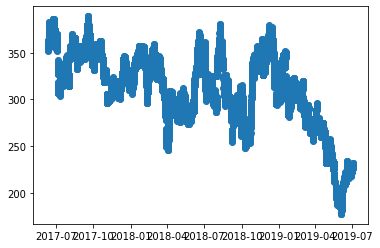

,price,price_5_min_ago,price_10_min_ago,price_15_min_ago,price_20_min_ago,price_25_min_ago,price_30_min_ago,price_35_min_ago,price_40_min_ago,price_45_min_ago,...,price_105_min_ago,price_110_min_ago,price_115_min_ago,price_120_min_ago,price_in_-30_min,class,time_sin,time_cos,date_sin,date_cos
date,,,,,,,,,,,,,,,,,,,,,
2017-06-12 15:30:00+00:00,363.500,361.510,361.375,361.955,361.690,361.010,362.120,360.440,361.190,361.950,...,353.770,353.590,353.560,356.035,359.200,-4,-0.006756,0.999977,0.345612,-0.938377
2017-06-12 15:35:00+00:00,363.160,363.500,361.510,361.375,361.955,361.690,361.010,362.120,360.440,361.190,...,352.415,353.770,353.590,353.560,359.000,-4,-0.006720,0.999977,0.345612,-0.938377
2017-06-12 15:40:00+00:00,361.140,363.160,363.500,361.510,361.375,361.955,361.690,361.010,362.120,360.440,...,353.020,352.415,353.770,353.590,359.700,-2,-0.006684,0.999978,0.345612,-0.938377
2017-06-12 15:45:00+00:00,360.700,361.140,363.160,363.500,361.510,361.375,361.955,361.690,361.010,362.120,...,354.640,353.020,352.415,353.770,359.505,-2,-0.006649,0.999978,0.345612,-0.938377
2017-06-12 15:50:00+00:00,360.680,360.700,361.140,363.160,363.500,361.510,361.375,361.955,361.690,361.010,...,352.500,354.640,353.020,352.415,357.690,-4,-0.006614,0.999978,0.345612,-0.938377
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-01 19:05:00+00:00,226.950,226.990,226.610,226.930,226.720,226.425,226.735,227.150,226.885,227.070,...,227.045,227.345,227.300,228.590,227.240,1,-0.005487,0.999985,0.025818,-0.999667
2019-07-01 19:10:00+00:00,227.365,226.950,226.990,226.610,226.930,226.720,226.425,226.735,227.150,226.885,...,227.110,227.045,227.345,227.300,227.240,0,-0.005464,0.999985,0.025818,-0.999667
2019-07-01 19:15:00+00:00,227.270,227.365,226.950,226.990,226.610,226.930,226.720,226.425,226.735,227.150,...,226.990,227.110,227.045,227.345,227.360,0,-0.005440,0.999985,0.025818,-0.999667


,price
date,
2019-07-02 13:30:00+00:00,227.065
2019-07-02 13:35:00+00:00,227.400
2019-07-02 13:40:00+00:00,226.140
2019-07-02 13:45:00+00:00,225.610
2019-07-02 13:50:00+00:00,226.090
...,...
2020-06-30 19:40:00+00:00,1079.090
2020-06-30 19:45:00+00:00,1076.760
2020-06-30 19:50:00+00:00,1079.680


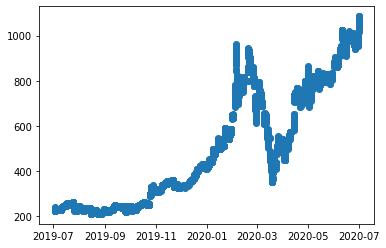

,price,price_5_min_ago,price_10_min_ago,price_15_min_ago,price_20_min_ago,price_25_min_ago,price_30_min_ago,price_35_min_ago,price_40_min_ago,price_45_min_ago,...,price_105_min_ago,price_110_min_ago,price_115_min_ago,price_120_min_ago,price_in_-30_min,class,time_sin,time_cos,date_sin,date_cos
date,,,,,,,,,,,,,,,,,,,,,
2019-07-02 15:30:00+00:00,223.45,223.950,223.895,224.030,224.940,224.560,224.145,224.000,224.390,223.070,...,225.610,226.140,227.400,227.065,222.755,-2,-0.006756,0.999977,0.008607,-0.999963
2019-07-02 15:35:00+00:00,223.13,223.450,223.950,223.895,224.030,224.940,224.560,224.145,224.000,224.390,...,226.090,225.610,226.140,227.400,223.170,0,-0.006720,0.999977,0.008607,-0.999963
2019-07-02 15:40:00+00:00,223.29,223.130,223.450,223.950,223.895,224.030,224.940,224.560,224.145,224.000,...,224.930,226.090,225.610,226.140,223.160,0,-0.006684,0.999978,0.008607,-0.999963
2019-07-02 15:45:00+00:00,223.27,223.290,223.130,223.450,223.950,223.895,224.030,224.940,224.560,224.145,...,225.230,224.930,226.090,225.610,223.395,0,-0.006649,0.999978,0.008607,-0.999963
2019-07-02 15:50:00+00:00,223.60,223.270,223.290,223.130,223.450,223.950,223.895,224.030,224.940,224.560,...,224.120,225.230,224.930,226.090,223.400,-1,-0.006614,0.999978,0.008607,-0.999963
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-30 19:10:00+00:00,1081.73,1080.155,1079.855,1082.415,1085.430,1083.070,1081.080,1083.720,1080.120,1076.780,...,1076.460,1076.385,1072.330,1074.400,1079.090,-2,-0.005464,0.999985,0.043022,-0.999074
2020-06-30 19:15:00+00:00,1081.97,1081.730,1080.155,1079.855,1082.415,1085.430,1083.070,1081.080,1083.720,1080.120,...,1075.910,1076.460,1076.385,1072.330,1076.760,-2,-0.005440,0.999985,0.043022,-0.999074
2020-06-30 19:20:00+00:00,1083.65,1081.970,1081.730,1080.155,1079.855,1082.415,1085.430,1083.070,1081.080,1083.720,...,1074.065,1075.910,1076.460,1076.385,1079.680,-2,-0.005417,0.999985,0.043022,-0.999074


class distribution in training data


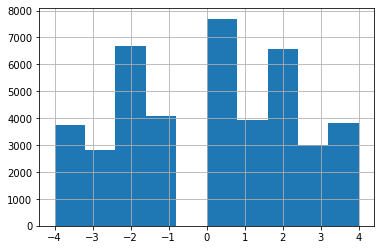

class distribution in test data


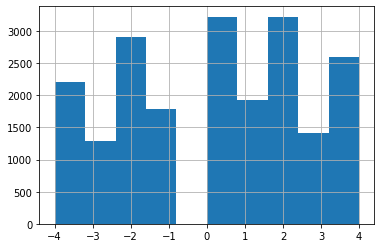

Training a Classifier
percent of time class was predicted successfully 15.663703919568702
percent of time class was within 1:  84.48200495410171
percent of time class was within 2:  90.04322696585555
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds

Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient Funds for investment
Insufficient F

ROI= 10.57%
Buy and Hold ROI 382.77%
That Took 94.6 seconds


In [950]:
symbols = [
#     "RIO",
#     "BA",
#     "BAC",
#     "XOM",
#     "GRUB",
# #     "AAPL",
#     "VZ",
#     "RDFN",
#     "PFE",
#     "KO",
#     "DUK",
#     "VTI",
    "TSLA",
]

for symbol in symbols:
    # start a timer to record how long this takes
    start = time.time()

    sim_data, sold_record = implementation_simulation(
    verbose=True,
    daily_retrain=False,
    symbol=symbol,
    start_date="2019-07-02",
    end_date="2020-07-01",
    training_data_extent=750,
    prediction_minutes=-30,
    n_steps_back = 24,
    base_investment=100,
    # starting balance should be absolute min of 6x (precition distance/interval) base investment
    starting_balance=1000,
)

    plot_sim_results(sim_data, title=f"Simulation Results for {symbol}")
    
    # print timer results
    end = time.time()
    print(f"That Took {end-start:.1f} seconds")

### To Do:

- Create presentation ( be sure to show security diversity etc.)

- retrain classifier throughout simulation (look into best methods of online training for RF [DONE]

- consider replacing input features (price at some time) with re-engineered features (coefficients for polynomial describing shape of price movement instead of price points. 
    - Two birds with one stone, this also deals with normalizing for stock splits, testing across different securities, etc.

- Consider value/uses of different number of classes.
    - Consider combining simplified classes (positive, negative, little movement) with confidence score to determine investment amount [DONE]
    - Consider tweaking cutoffs for classes based on stock volatility


- Consider normalizing all pricing data 
    - Would make sure model is not sensitive to stock splits, etc. 

- Think about precision/recall tradeoff for this model
    - Consider using all price data (high, low, open, close) at each time point for performance improvements. 
        - indicates volatility "within" a point

- Consider better researching cutoffs for classes (in classify_price_change())
    - They are currently a tad arbitrary...may need to reconsider
    - Could just add to GridSearch. Also probably needs some more hands on analysis
    - The average price change of entire stock market is around 0.75% / day
        - no sense how much of that is negative price movement
        
- Consider experimenting with different historical inputs, and prediction time windows
    - besides 2 hour back and 1 hour in the future
    - A rough test shows (unsurprisingly) that as n_steps_back increases and as abs(prediction_minutes) decreases, the predictions improve
    
- Think about scoring and benchmarks for final models.
    - A Buy and Hold strategy may not be the best comparison for a highly active strategy
    - Consider how you measure/compare ROIs
        - tough to assess because ROI is so closely tied to the periodic investment price not the overall initial investment
            - May need to model scenarios determining performance where ratio between periodic invesmtnet price and overall initially investment is tested.
            
- Consider normalization of class frequencies 
    - could it be better to not?? better represent real world??
    
- Consider increasing data resolution (5 to 1 min)

- Consider Optimizing tick data fetching with local db
- Consider adding failsafes for unexpected behavior (e.g. during market crash)

In [ ]:
# consider refactoring/repurposing this code
# i like the baseline of "perfect gain" if the model was 100% perfect

# investment_base = 100
# hist_comp = history[["price", "price_in_-60_min", "class", "prediction"]]
# hist_comp["percent_change"] = (
#     hist_comp["price_in_-60_min"] - hist_comp["price"]
# ) / hist_comp["price"]
# hist_comp["gain"] = hist_comp.apply(
#     lambda row: investment_base * row["prediction"] * row["percent_change"]
#     if row["prediction"] > 0
#     else 0,
#     axis=1,
# )
# hist_comp["perfect_gain"] = hist_comp.apply(
#     lambda row: investment_base * row["class"] * row["percent_change"]
#     if row["class"] > 0
#     else 0,
#     axis=1,
# )

# print(f'Model Based Gains: {hist_comp["gain"].sum():.2f}')
# print(f'Ideal Gains: {hist_comp["perfect_gain"].sum():.2f}')